# **Mobile Price Range Classification**

**Problem Statement** : Market size of mobile phones if growing everyday and so is the competition.To capture the maximum market electronics companies try to make improvements in their products. However, sales of mobile phones depend on various factors like demand, technology, marketing, brand, availability, user experience, service, price, etc. As we understand that selling price makes a huge difference when it comes to sales and profits.
Estimating an optimal price for a new mobile phone can be a tricky task especially when you are new in the business or when you want to launch a new kind of mobile phone in the market.

As part of this exercise we will try to estimate the price range for a given mobile phone using given feature information. These details are collected from various similar companies.  

## **Import Libraries**

In [1]:
# used to supress display of warnings
import warnings

# os is used to provide a way of using operating system dependent functionality
# We use it for setting working folder
import os

# Pandas is used for data manipulation and analysis
import pandas as pd

# Numpy is used for large, multi-dimensional arrays and matrices, along with mathematical operators on these arrays
import numpy as np

# Matplotlib is a data visualization library for 2D plots of arrays, built on NumPy arrays
# and designed to work with the broader SciPy stack
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import pyplot
# Seaborn is based on matplotlib, which aids in drawing attractive and informative statistical graphics.
import seaborn as sns



## **Setting Options**

In [ ]:
# suppress display of warnings
warnings.filterwarnings('ignore')

# display all dataframe columns
pd.options.display.max_columns = None

# to set the limit to 3 decimals
pd.options.display.float_format = '{:.7f}'.format

# display all dataframe rows
pd.options.display.max_rows = None

## **Read Data**

In [ ]:
df =  pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Mobile.csv")   # loading dataset

In [ ]:
df.head()            # to display the top 5 rows of the dataframe

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2000000,0,1,0,7,0.6000000,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5000000,1,0,1,53,0.7000000,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5000000,1,2,1,41,0.9000000,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5000000,0,0,0,10,0.8000000,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2000000,0,13,1,44,0.6000000,141,2,14,1208,1212,1411,8,2,15,1,1,0,1


In [ ]:
df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [ ]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000
mean,1238.5185000,0.4950000,1.5222500,0.5095000,4.3095000,0.5215000,32.0465000,0.5017500,140.2490000,4.5205000,9.9165000,645.1080000,1251.5155000,2124.2130000,12.3065000,5.7670000,11.0110000,0.7615000,0.5030000,0.5070000,1.5000000
std,439.4182061,0.5001000,0.8160042,0.5000348,4.3414437,0.4996625,18.1457150,0.2884155,35.3996549,2.2878367,6.0643149,443.7808108,432.1994469,1084.7320436,4.2132450,4.3563976,5.4639552,0.4262729,0.5001160,0.5000760,1.1183136
min,501.0000000,0.0000000,0.5000000,0.0000000,0.0000000,0.0000000,2.0000000,0.1000000,80.0000000,1.0000000,0.0000000,0.0000000,500.0000000,256.0000000,5.0000000,0.0000000,2.0000000,0.0000000,0.0000000,0.0000000,0.0000000
25%,851.7500000,0.0000000,0.7000000,0.0000000,1.0000000,0.0000000,16.0000000,0.2000000,109.0000000,3.0000000,5.0000000,282.7500000,874.7500000,1207.5000000,9.0000000,2.0000000,6.0000000,1.0000000,0.0000000,0.0000000,0.7500000
50%,1226.0000000,0.0000000,1.5000000,1.0000000,3.0000000,1.0000000,32.0000000,0.5000000,141.0000000,4.0000000,10.0000000,564.0000000,1247.0000000,2146.5000000,12.0000000,5.0000000,11.0000000,1.0000000,1.0000000,1.0000000,1.5000000
75%,1615.2500000,1.0000000,2.2000000,1.0000000,7.0000000,1.0000000,48.0000000,0.8000000,170.0000000,7.0000000,15.0000000,947.2500000,1633.0000000,3064.5000000,16.0000000,9.0000000,16.0000000,1.0000000,1.0000000,1.0000000,2.2500000
max,1998.0000000,1.0000000,3.0000000,1.0000000,19.0000000,1.0000000,64.0000000,1.0000000,200.0000000,8.0000000,20.0000000,1960.0000000,1998.0000000,3998.0000000,19.0000000,18.0000000,20.0000000,1.0000000,1.0000000,1.0000000,3.0000000


In [ ]:
df.tail()                              # it gives last 5 rows of dataset

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5000000,1,0,1,2,0.8000000,106,6,14,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6000000,1,0,0,39,0.2000000,187,4,3,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9000000,1,1,1,36,0.7000000,108,8,3,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9000000,0,4,1,46,0.1000000,145,5,5,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0000000,1,5,1,45,0.9000000,168,6,16,483,754,3919,19,4,2,1,1,1,3


In [ ]:
df.shape               # to display the dimension of the dataframe

(2000, 21)

## Dataframe has 21 columns and 2000 rows

In [ ]:
# to display the column names of the dataframe
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

From the above output, we see that except for the columns of clock_speed and m_dep all our columns datatype is int64.



In [ ]:
df.info()                            # it gives data type and non_null count of each column

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [ ]:
df.describe()                   # it give statistical information about numerical values

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000,2000.0000000
mean,1238.5185000,0.4950000,1.5222500,0.5095000,4.3095000,0.5215000,32.0465000,0.5017500,140.2490000,4.5205000,9.9165000,645.1080000,1251.5155000,2124.2130000,12.3065000,5.7670000,11.0110000,0.7615000,0.5030000,0.5070000,1.5000000
std,439.4182061,0.5001000,0.8160042,0.5000348,4.3414437,0.4996625,18.1457150,0.2884155,35.3996549,2.2878367,6.0643149,443.7808108,432.1994469,1084.7320436,4.2132450,4.3563976,5.4639552,0.4262729,0.5001160,0.5000760,1.1183136
min,501.0000000,0.0000000,0.5000000,0.0000000,0.0000000,0.0000000,2.0000000,0.1000000,80.0000000,1.0000000,0.0000000,0.0000000,500.0000000,256.0000000,5.0000000,0.0000000,2.0000000,0.0000000,0.0000000,0.0000000,0.0000000
25%,851.7500000,0.0000000,0.7000000,0.0000000,1.0000000,0.0000000,16.0000000,0.2000000,109.0000000,3.0000000,5.0000000,282.7500000,874.7500000,1207.5000000,9.0000000,2.0000000,6.0000000,1.0000000,0.0000000,0.0000000,0.7500000
50%,1226.0000000,0.0000000,1.5000000,1.0000000,3.0000000,1.0000000,32.0000000,0.5000000,141.0000000,4.0000000,10.0000000,564.0000000,1247.0000000,2146.5000000,12.0000000,5.0000000,11.0000000,1.0000000,1.0000000,1.0000000,1.5000000
75%,1615.2500000,1.0000000,2.2000000,1.0000000,7.0000000,1.0000000,48.0000000,0.8000000,170.0000000,7.0000000,15.0000000,947.2500000,1633.0000000,3064.5000000,16.0000000,9.0000000,16.0000000,1.0000000,1.0000000,1.0000000,2.2500000
max,1998.0000000,1.0000000,3.0000000,1.0000000,19.0000000,1.0000000,64.0000000,1.0000000,200.0000000,8.0000000,20.0000000,1960.0000000,1998.0000000,3998.0000000,19.0000000,18.0000000,20.0000000,1.0000000,1.0000000,1.0000000,3.0000000


### The above output prints the important summary statistics of all the numeric variables like the mean, median (50%), minimum, and maximum values, along with the standard deviation.

In [ ]:
df[df.duplicated()]                    #This line shows that we are checking for the duplicated rows in the dataset

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range


### There are no duplicate rows in this data set

In [ ]:
df.isnull().sum()        # Checking if the dataset has any null values in it

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

### There are no missing values in the data.

In [ ]:
df.corr()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
battery_power,1.0000000,0.0112516,0.0114816,-0.0418468,0.0333344,0.0156646,-0.0040037,0.0340845,0.0018444,-0.0297273,0.0314407,0.0149008,-0.0084018,-0.0006529,-0.0299586,-0.0214209,0.0525104,0.0115222,-0.0105158,-0.0083429,0.2007226
blue,0.0112516,1.0000000,0.0214187,0.0351981,0.0035932,0.0134431,0.0411772,0.0040492,-0.0086046,0.0361607,-0.0099522,-0.0068724,-0.0415334,0.0263509,-0.0029523,0.0006131,0.0139337,-0.0302362,0.0100607,-0.0218632,0.0205729
clock_speed,0.0114816,0.0214187,1.0000000,-0.0013152,-0.0004339,-0.0430734,0.0065451,-0.0143644,0.0123497,-0.0057242,-0.0052450,-0.0145229,-0.0094757,0.0034430,-0.0290776,-0.0073784,-0.0114319,-0.0464335,0.0197558,-0.0244710,-0.0066057
dual_sim,-0.0418468,0.0351981,-0.0013152,1.0000000,-0.0291228,0.0031865,-0.0156790,-0.0221417,-0.0089794,-0.0246581,-0.0171426,-0.0208753,0.0142905,0.0410720,-0.0119493,-0.0166661,-0.0394040,-0.0140076,-0.0171174,0.0227403,0.0174445
fc,0.0333344,0.0035932,-0.0004339,-0.0291228,1.0000000,-0.0165597,-0.0291328,-0.0017911,0.0236180,-0.0133562,0.6445953,-0.0099899,-0.0051756,0.0150990,-0.0110140,-0.0123726,-0.0068286,0.0017926,-0.0148278,0.0200849,0.0219982
four_g,0.0156646,0.0134431,-0.0430734,0.0031865,-0.0165597,1.0000000,0.0086900,-0.0018233,-0.0165367,-0.0297055,-0.0055982,-0.0192362,0.0074482,0.0073135,0.0271655,0.0370050,-0.0466278,0.5842456,0.0167578,-0.0176200,0.0147717
int_memory,-0.0040037,0.0411772,0.0065451,-0.0156790,-0.0291328,0.0086900,1.0000000,0.0068858,-0.0342142,-0.0283104,-0.0332734,0.0104413,-0.0083349,0.0328132,0.0377711,0.0117305,-0.0027903,-0.0093660,-0.0269987,0.0069930,0.0444350
m_dep,0.0340845,0.0040492,-0.0143644,-0.0221417,-0.0017911,-0.0018233,0.0068858,1.0000000,0.0217561,-0.0035039,0.0262824,0.0252629,0.0235663,-0.0094341,-0.0253478,-0.0183881,0.0170026,-0.0120654,-0.0026375,-0.0283527,0.0008530
mobile_wt,0.0018444,-0.0086046,0.0123497,-0.0089794,0.0236180,-0.0165367,-0.0342142,0.0217561,1.0000000,-0.0189888,0.0188439,0.0009393,0.0000898,-0.0025805,-0.0338547,-0.0207605,0.0062085,0.0015506,-0.0143682,-0.0004094,-0.0303022
n_cores,-0.0297273,0.0361607,-0.0057242,-0.0246581,-0.0133562,-0.0297055,-0.0283104,-0.0035039,-0.0189888,1.0000000,-0.0011926,-0.0068721,0.0244799,0.0048683,-0.0003148,0.0258265,0.0131479,-0.0147327,0.0237742,-0.0099635,0.0043993


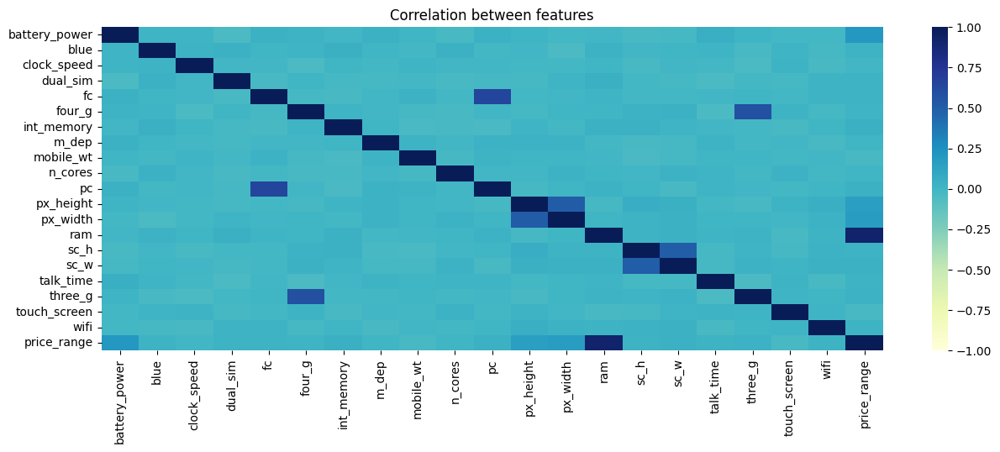

In [ ]:
# To get a correlation matrix
# Ploting correlation plot
corr = df.corr()
plt.figure(figsize=(15, 5))

# plotting the heat map
# corr: give the correlation matrix
# cmap: colour code used for plotting
# vmax: gives maximum range of values for the chart
# vmin: gives minimum range of values for the chart

sns.heatmap(corr, cmap='YlGnBu', vmax=1.0, vmin=-1.0)

# specify name of the plot
plt.title('Correlation between features')
plt.show()

Observations

1. We can see that ram is highly correlated with price range
2. four_g and three_g also have some relationship
3. pc ( primary camera) and fc (front camera) are also related
4. Most of the features are not corelated to each other
5. Few features like clock_speed, m_dep, n_cores are not having much relationship with price range and can be dropped

In [ ]:
# Check Frequency count between price range and ram
pd.crosstab(df['ram'],df['price_range'])

price_range,0,1,2,3
ram,,,,
256,1,0,0,0
258,2,0,0,0
259,1,0,0,0
262,1,0,0,0
263,1,0,0,0
265,1,0,0,0
267,1,0,0,0
273,1,0,0,0
277,1,0,0,0


### We can see that as 'RAM' increases the price also increases

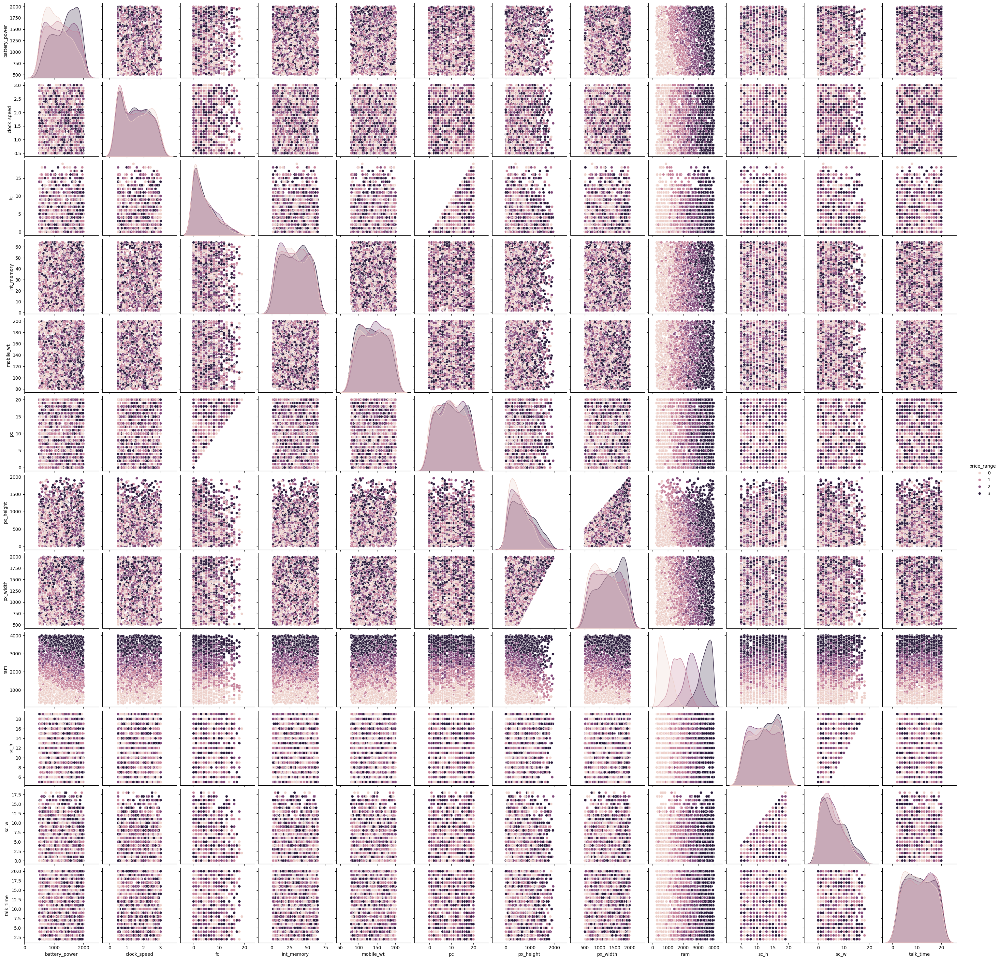

In [ ]:
# Creating pairplot
sns.pairplot(df, vars=['battery_power', 'clock_speed', 'fc', 'int_memory', 'mobile_wt', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time'], hue='price_range', diag_kind='kde')
plt.show()

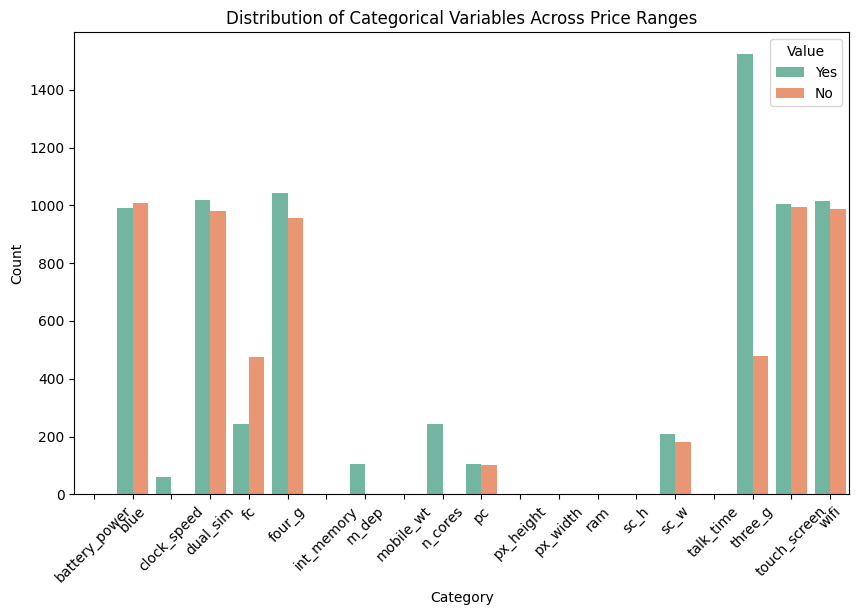

In [ ]:
# Melt the DataFrame to long format for easier plotting
df_melted = pd.melt(df, id_vars=['price_range'], var_name='category', value_name='value')

# Plotting
plt.figure(figsize=(10, 6))
sns.countplot(data=df_melted, x='category', hue='value', hue_order=[1, 0], palette="Set2")
plt.title('Distribution of Categorical Variables Across Price Ranges')
plt.xlabel('Category')
plt.ylabel('Count')
plt.legend(title='Value', labels=['Yes', 'No'])
plt.xticks(rotation=45)
plt.show()

This bar plot showing the distribution of each categorical variable ('blue', 'dual_sim', 'four_g', 'three_g', 'touch_screen', 'wifi') across different price ranges based on the dataset.

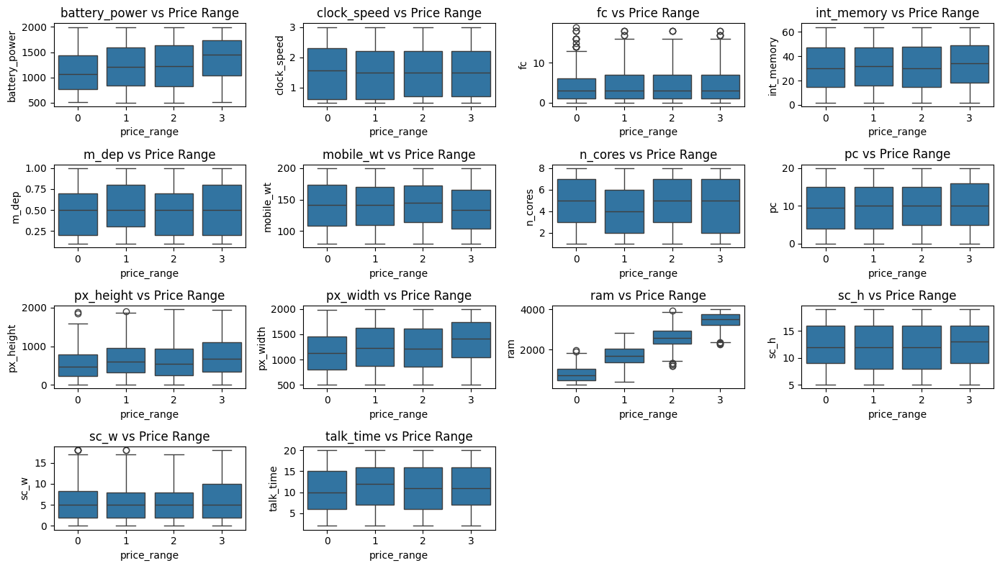

In [ ]:
# Select numerical columns for box plots
numerical_columns = ['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt',
                     'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']

# Plotting box plots for each numerical feature across different price ranges
plt.figure(figsize=(14, 8))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x='price_range', y=column, data=df)
    plt.title(f'{column} vs Price Range')

plt.tight_layout()
plt.show()

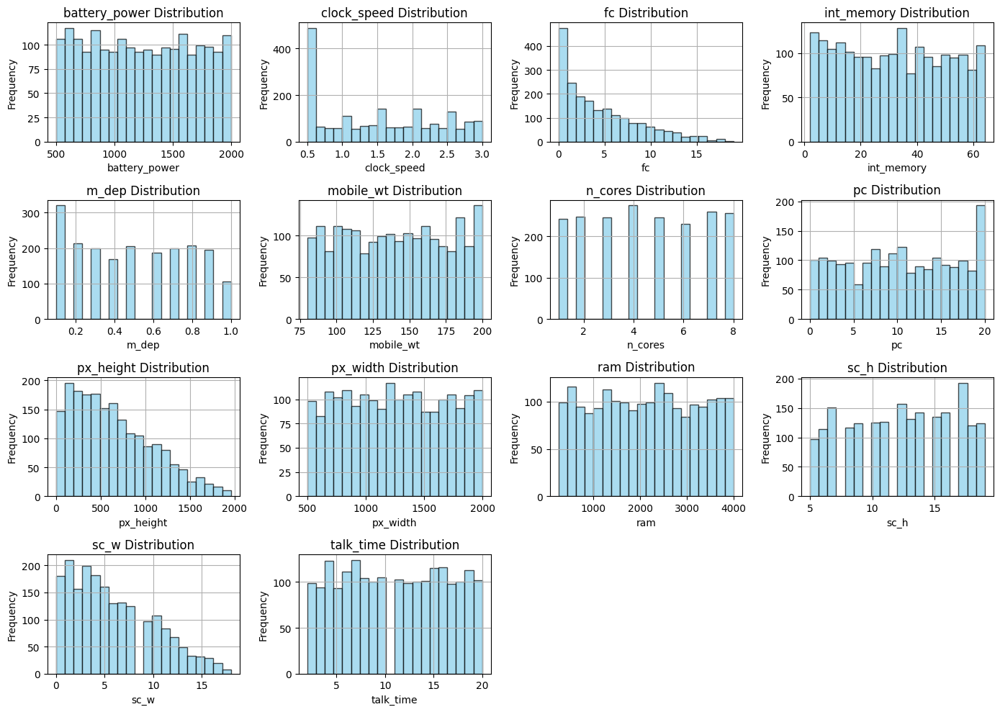

In [ ]:
# Select numerical columns for histograms
numerical_columns = ['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt',
                     'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']

# Plot histograms for each numerical feature
plt.figure(figsize=(14, 10))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(4, 4, i)
    plt.hist(df[column], bins=20, color='skyblue', edgecolor='black', alpha=0.7)
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title(f'{column} Distribution')
    plt.grid(True)

plt.tight_layout()
plt.show()

**Importance of detecting an outlier**

One of the most important tasks from large data sets is to find an outlier, which is defined as a sample or event that is very inconsistent with the rest of the data set. The observation point or value would be distant from the other observations in the data set.

Recollect that one of the assumption of Logistic Regression is there should be no outliers

<Axes: >

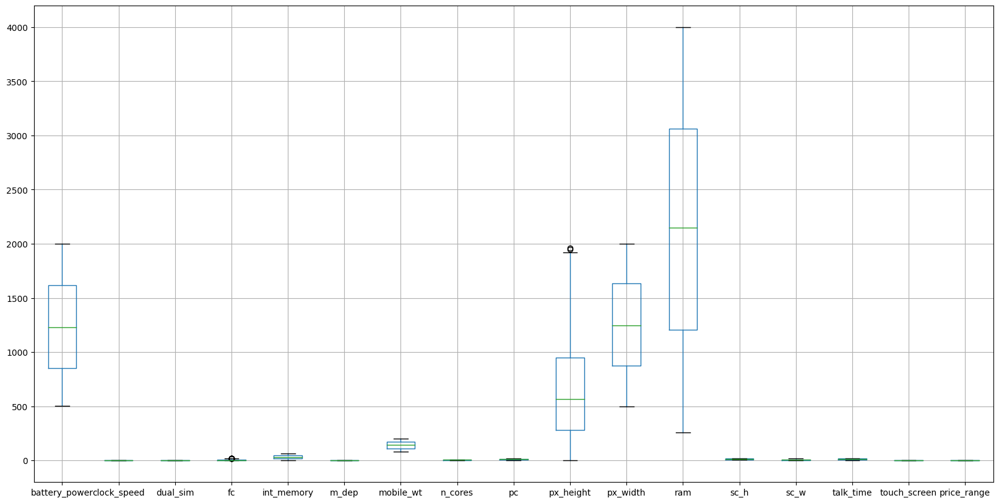

In [ ]:
# create a boxplot for all the continuous features
df.boxplot(column = ['battery_power', 'clock_speed', 'dual_sim', 'fc',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time',
       'touch_screen', 'price_range'], figsize = (20,10))

In [ ]:
df['px_height'].describe()

count    2000.000000
mean      645.108000
std       443.780811
min         0.000000
25%       282.750000
50%       564.000000
75%       947.250000
max      1960.000000
Name: px_height, dtype: float64

As we know that pixel height can be 1960. There are no outliers.

# **Logistic Regression**

In [ ]:
## Scikit-learn features various classification, regression and clustering algorithms
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn import preprocessing
from sklearn.metrics import average_precision_score, confusion_matrix, accuracy_score, classification_report


In [ ]:
# Select independent features for model building.
X = df.iloc[:,:20]

y = df['price_range']

# split data into train subset and test subset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# checking the dimensions of the train & test subset
# to print dimension of train set
print(X_train.shape)
# to print dimension of test set
print(X_test.shape)

(1400, 20)
(600, 20)


In [ ]:
# import logistic regression and train on tarining set
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(random_state=0)
model.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [ ]:
# Predict price range of test data
y_pred = model.predict(X_test)
y_pred

array([0, 2, 0, 3, 1, 2, 2, 0, 3, 3, 0, 1, 2, 3, 2, 1, 2, 2, 1, 0, 0, 1,
       0, 2, 1, 1, 3, 3, 2, 0, 1, 0, 3, 0, 2, 3, 2, 1, 3, 0, 1, 2, 3, 0,
       3, 3, 3, 1, 3, 1, 3, 2, 0, 0, 2, 0, 1, 2, 0, 0, 1, 3, 2, 2, 2, 0,
       3, 3, 1, 1, 2, 1, 0, 1, 2, 0, 0, 3, 1, 1, 3, 2, 1, 0, 1, 3, 2, 3,
       3, 0, 3, 3, 3, 0, 3, 2, 3, 3, 2, 1, 0, 1, 0, 0, 1, 3, 3, 0, 0, 1,
       0, 0, 3, 3, 2, 1, 3, 3, 0, 2, 1, 3, 2, 2, 3, 3, 0, 3, 0, 2, 3, 0,
       2, 2, 0, 2, 1, 0, 0, 2, 3, 1, 3, 3, 0, 0, 1, 2, 1, 2, 3, 1, 1, 0,
       2, 3, 0, 1, 0, 1, 3, 3, 2, 2, 1, 0, 0, 2, 1, 3, 3, 1, 0, 0, 3, 1,
       1, 2, 0, 1, 0, 0, 0, 1, 3, 2, 0, 2, 0, 0, 0, 0, 2, 3, 3, 1, 0, 1,
       1, 1, 1, 2, 1, 2, 3, 3, 1, 3, 0, 1, 1, 1, 1, 1, 3, 1, 1, 3, 1, 1,
       3, 2, 3, 0, 0, 2, 0, 2, 0, 0, 1, 0, 2, 3, 2, 1, 0, 2, 3, 1, 3, 3,
       2, 3, 0, 3, 2, 2, 3, 3, 3, 1, 1, 3, 2, 1, 3, 3, 3, 3, 3, 0, 2, 2,
       2, 2, 3, 0, 3, 3, 2, 2, 2, 0, 1, 2, 0, 2, 3, 1, 3, 1, 1, 3, 0, 3,
       0, 0, 3, 0, 1, 2, 3, 2, 2, 0, 1, 0, 0, 3, 3,

In [ ]:
# Let's measure the accuracy of this model's prediction
accuracy_score(y_test, y_pred)

0.635

In [ ]:
# And some other metrics

print(classification_report(y_test, y_pred, digits=2))

              precision    recall  f1-score   support

           0       0.80      0.75      0.78       151
           1       0.52      0.51      0.51       146
           2       0.51      0.53      0.52       148
           3       0.71      0.74      0.72       155

    accuracy                           0.64       600
   macro avg       0.64      0.63      0.63       600
weighted avg       0.64      0.64      0.64       600



<Axes: >

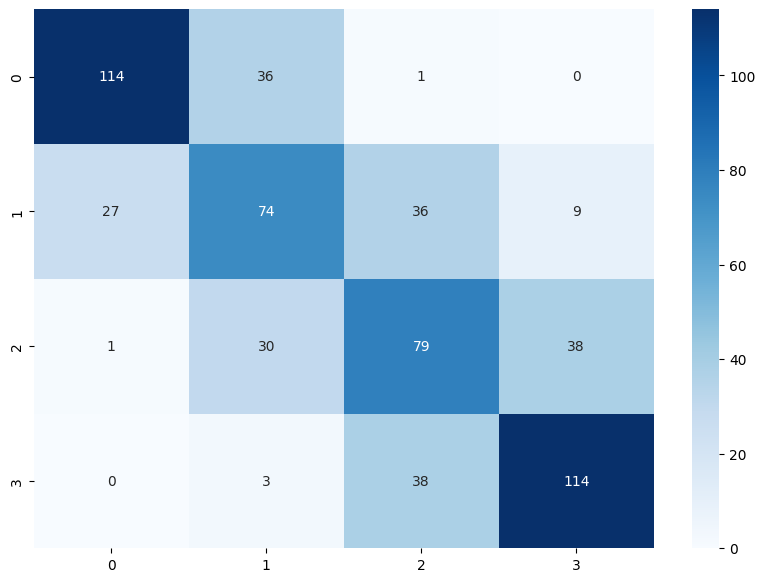

In [ ]:
# Display confusion matrix
conf_mat = confusion_matrix(y_test, y_pred)
df_conf_mat = pd.DataFrame(conf_mat)
plt.figure(figsize = (10,7))
sns.heatmap(df_conf_mat, annot=True,cmap='Blues', fmt='g')

# **Standardize the data**

In [ ]:
# import zscore for scaling the data
from scipy.stats import zscore

In [ ]:
# Apply zscore on independent features
xtrainsc = X_train.apply(zscore)
xtestsc = X_test.apply(zscore)

In [ ]:
# Fit the logistic regression model on scaled data

model1 = LogisticRegression(random_state=0)
model1.fit(xtrainsc, y_train)

LogisticRegression(random_state=0)

In [ ]:
model1.score(xtrainsc, y_train)

0.9764285714285714

In [ ]:
model1.score(xtestsc, y_test)

0.9616666666666667

In [ ]:
ypred = model1.predict(xtestsc)

<Axes: >

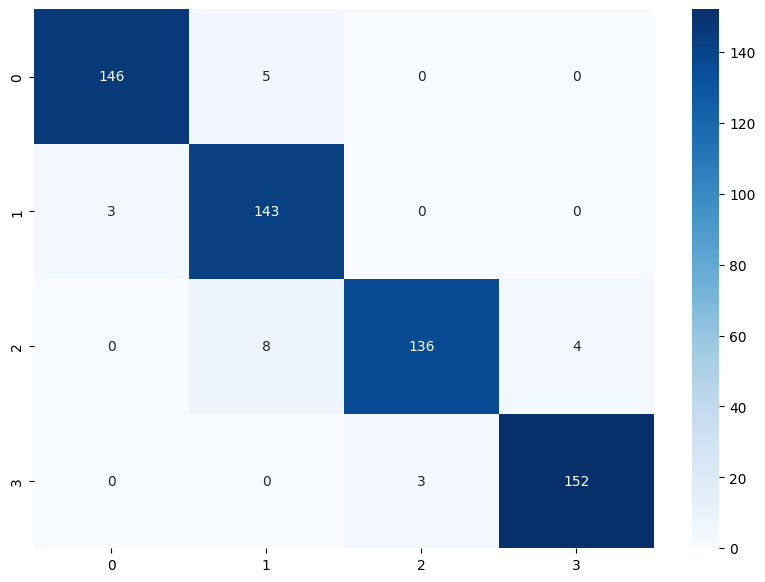

In [ ]:
conf_mat = confusion_matrix(y_test, ypred)
df_conf_mat = pd.DataFrame(conf_mat)
plt.figure(figsize = (10,7))
sns.heatmap(df_conf_mat, annot=True,cmap='Blues', fmt='g')

In [ ]:
print(classification_report(y_test, ypred, digits=2))

              precision    recall  f1-score   support

           0       0.98      0.97      0.97       151
           1       0.92      0.98      0.95       146
           2       0.98      0.92      0.95       148
           3       0.97      0.98      0.98       155

    accuracy                           0.96       600
   macro avg       0.96      0.96      0.96       600
weighted avg       0.96      0.96      0.96       600



In [ ]:
model1.classes_

array([0, 1, 2, 3])

In [ ]:
y_pred

array([0, 2, 0, 3, 1, 2, 2, 0, 3, 3, 0, 1, 2, 3, 2, 1, 2, 2, 1, 0, 0, 1,
       0, 2, 1, 1, 3, 3, 2, 0, 1, 0, 3, 0, 2, 3, 2, 1, 3, 0, 1, 2, 3, 0,
       3, 3, 3, 1, 3, 1, 3, 2, 0, 0, 2, 0, 1, 2, 0, 0, 1, 3, 2, 2, 2, 0,
       3, 3, 1, 1, 2, 1, 0, 1, 2, 0, 0, 3, 1, 1, 3, 2, 1, 0, 1, 3, 2, 3,
       3, 0, 3, 3, 3, 0, 3, 2, 3, 3, 2, 1, 0, 1, 0, 0, 1, 3, 3, 0, 0, 1,
       0, 0, 3, 3, 2, 1, 3, 3, 0, 2, 1, 3, 2, 2, 3, 3, 0, 3, 0, 2, 3, 0,
       2, 2, 0, 2, 1, 0, 0, 2, 3, 1, 3, 3, 0, 0, 1, 2, 1, 2, 3, 1, 1, 0,
       2, 3, 0, 1, 0, 1, 3, 3, 2, 2, 1, 0, 0, 2, 1, 3, 3, 1, 0, 0, 3, 1,
       1, 2, 0, 1, 0, 0, 0, 1, 3, 2, 0, 2, 0, 0, 0, 0, 2, 3, 3, 1, 0, 1,
       1, 1, 1, 2, 1, 2, 3, 3, 1, 3, 0, 1, 1, 1, 1, 1, 3, 1, 1, 3, 1, 1,
       3, 2, 3, 0, 0, 2, 0, 2, 0, 0, 1, 0, 2, 3, 2, 1, 0, 2, 3, 1, 3, 3,
       2, 3, 0, 3, 2, 2, 3, 3, 3, 1, 1, 3, 2, 1, 3, 3, 3, 3, 3, 0, 2, 2,
       2, 2, 3, 0, 3, 3, 2, 2, 2, 0, 1, 2, 0, 2, 3, 1, 3, 1, 1, 3, 0, 3,
       0, 0, 3, 0, 1, 2, 3, 2, 2, 0, 1, 0, 0, 3, 3,

In [ ]:
classification = X_test.copy(deep=True)

In [ ]:
classification['prediction']=y_pred

In [ ]:
classification

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,prediction
1860,1646,0,2.5,0,3,1,25,0.6,200,2,...,211,1608,686,8,6,11,1,1,0,0
353,1182,0,0.5,0,7,1,8,0.5,138,8,...,275,986,2563,19,17,19,1,0,0,2
1333,1972,0,2.9,0,9,0,14,0.4,196,7,...,293,952,1316,8,1,8,1,1,0,0
905,989,1,2.0,0,4,0,17,0.2,166,3,...,256,1394,3892,18,7,19,1,1,0,3
1289,615,1,0.5,1,7,0,58,0.5,130,5,...,1021,1958,1906,14,5,5,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148,1216,0,3.0,0,4,0,47,0.4,199,3,...,1852,1967,2268,13,5,4,0,1,1,1
1554,1957,0,1.2,1,18,1,36,0.8,151,2,...,1194,1727,1115,16,2,18,1,0,1,1
1956,555,1,0.5,1,2,0,17,0.2,163,5,...,956,1010,343,19,14,3,0,1,1,0
925,1048,1,1.5,0,2,1,29,1.0,182,1,...,29,1670,2146,11,10,2,1,0,0,1


# **Conclusion**

1. We are able to classify price range with an accuracy of 96%
2. 'RAM' seems to be highly correlated with the price range
3. 'battery power' is also an deciding factor of the price
4. Few features like clock_speed, m_dep, n_cross are not having much relationship with price range
5. Standardization of data improves accuracy drastically
6. Few cases were misclassified. However, there were zero misclassification in far classes ( like none of the low cost prices were predicted as high cost). Hence we can say that our model is good for production.